# Import das bibliotecas

In [1]:
import pandas as pd
import inflection
import plotly.express as px
import folium
from folium.plugins import MarkerCluster

# Carregamento dos dados brutos e cópia para manipulação

In [2]:
df = pd.read_csv('dataset\zomato.csv') # Carregando os dados brutos

In [3]:
df1 = df.copy() # Criando uma cópia para manipulação

In [4]:
pd.set_option('display.max_columns', None) # Mostrando todas as colunas

In [5]:
df.info() # Informações do dataset original

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7527 entries, 0 to 7526
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         7527 non-null   int64  
 1   Restaurant Name       7527 non-null   object 
 2   Country Code          7527 non-null   int64  
 3   City                  7527 non-null   object 
 4   Address               7527 non-null   object 
 5   Locality              7527 non-null   object 
 6   Locality Verbose      7527 non-null   object 
 7   Longitude             7527 non-null   float64
 8   Latitude              7527 non-null   float64
 9   Cuisines              7512 non-null   object 
 10  Average Cost for two  7527 non-null   int64  
 11  Currency              7527 non-null   object 
 12  Has Table booking     7527 non-null   int64  
 13  Has Online delivery   7527 non-null   int64  
 14  Is delivering now     7527 non-null   int64  
 15  Switch to order menu 

In [6]:
df.isnull().sum() # Checando a presença de dados nulos

Restaurant ID            0
Restaurant Name          0
Country Code             0
City                     0
Address                  0
Locality                 0
Locality Verbose         0
Longitude                0
Latitude                 0
Cuisines                15
Average Cost for two     0
Currency                 0
Has Table booking        0
Has Online delivery      0
Is delivering now        0
Switch to order menu     0
Price range              0
Aggregate rating         0
Rating color             0
Rating text              0
Votes                    0
dtype: int64

In [7]:
df.shape # Tamanho do dataset original

(7527, 21)

In [8]:
df.columns # Colunas do dataset original

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

# Limpeza e Tratamentos (funções)

In [9]:
df1 = df1.drop_duplicates() # Deletando valores duplicados

In [10]:
df1 = df1.loc[(df1['Cuisines'].notnull()) , :] # Deletando valores nulos de Cuisines

In [11]:
df1.isnull().sum() # Checando a presença de dados nulos

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [12]:
df1.shape # Tamanho do dataset limpo

(6929, 21)

In [13]:
# Ajustes na coluna de países
COUNTRIES = {
    1: "India",
    14: "Australia",
    30: "Brazil",
    37: "Canada",
    94: "Indonesia",
    148: "New Zeland",
    162: "Philippines",
    166: "Qatar",
    184: "Singapure",
    189: "South Africa",
    191: "Sri Lanka",
    208: "Turkey",
    214: "United Arab Emirates",
    215: "England",
    216: "United States of America"
}
def country_name(country_id):
    return COUNTRIES[country_id]

df1['Country Code'] = df1['Country Code'].map(COUNTRIES) # Trocando os códigos pelo nome dos países

df1.rename(columns={'Country Code': 'Country Name'}, inplace=True) # Renomeando a coluna dos países

In [14]:
# Padronizar o nome das colunas do DataFrame
def rename_columns(dataframe):
    df1 = dataframe.copy()
    title = lambda x: inflection.titleize(x)
    snakecase = lambda x: inflection.underscore(x)
    spaces = lambda x: x.replace(" ", "")
    cols_old = list(df1.columns)
    cols_old = list(map(title, cols_old))
    cols_old = list(map(spaces, cols_old))
    cols_new = list(map(snakecase, cols_old))
    df1.columns = cols_new
    
    return df1

df1 = rename_columns(df1) # Aplicar o novo nome nas colunas

df1.drop(['address', 'locality', 'locality_verbose', 'rating_text', 'switch_to_order_menu'], axis=1, inplace=True) # Apagar as colunas que não serão usadas nas análises

In [15]:
df1.columns # Colunas do dataset após tratamentos

Index(['restaurant_id', 'restaurant_name', 'country_name', 'city', 'longitude',
       'latitude', 'cuisines', 'average_cost_for_two', 'currency',
       'has_table_booking', 'has_online_delivery', 'is_delivering_now',
       'price_range', 'aggregate_rating', 'rating_color', 'votes'],
      dtype='object')

In [16]:
df1['cuisines'] = df1.loc[:, "cuisines"].apply(lambda x: x.split(",")[0]) # Deixando apenas um tipo de cozinha por registro

In [17]:
# Criação do Tipo de Categoria de Comida
def create_price_tye(price_range):
    if price_range == 1:
        return "cheap"
    elif price_range == 2:
        return "normal"
    elif price_range == 3:
        return "expensive"
    else:
        return "gourmet"

In [18]:
# Criação do nome das Cores
COLORS = {
    "3F7E00": "darkgreen",
    "5BA829": "green",
    "9ACD32": "lightgreen",
    "CDD614": "orange",
    "FFBA00": "red",
    "CBCBC8": "darkred",
    "FF7800": "darkred"
}
def color_name(color_code):
    return COLORS[color_code]

df1['color_name'] = df1['rating_color'].map(COLORS)

In [19]:
df1.reset_index(inplace=True, drop=True) # Reset do index

In [20]:
df1.loc[356: 366, 'average_cost_for_two'] # Valor outlier na Australia

356    25000017
357          40
358          75
359         160
360          80
361          60
362          60
363          70
364          80
365          75
366         110
Name: average_cost_for_two, dtype: int64

In [21]:
# Substituindo um outlier na Australia
df1.loc[356, 'average_cost_for_two'] = 250

In [22]:
df1['currency'].unique() # Ajustar as cotações e deixar tudo em USD para ter uma base de comparação correta

array(['Botswana Pula(P)', 'Brazilian Real(R$)', 'Dollar($)',
       'Emirati Diram(AED)', 'Indian Rupees(Rs.)',
       'Indonesian Rupiah(IDR)', 'NewZealand($)', 'Pounds(£)',
       'Qatari Rial(QR)', 'Rand(R)', 'Sri Lankan Rupee(LKR)',
       'Turkish Lira(TL)'], dtype=object)

In [23]:
# Função para converter os valores para USD com base na cotação de 24/08/2024
def currency_to_dollar(average_cost_for_two, currency):
    if currency == 'Botswana Pula(P)':
        return average_cost_for_two * 0.0748
    elif currency == 'Brazilian Real(R$)':
        return average_cost_for_two * 0.1830
    elif currency == 'Emirati Diram(AED)':
        return average_cost_for_two * 0.2722
    elif currency == 'Indian Rupees(Rs.)':
        return average_cost_for_two * 0.01190
    elif currency == 'Indonesian Rupiah(IDR)':
        return average_cost_for_two * 0.000065
    elif currency == 'NewZealand($)':
        return average_cost_for_two * 0.6232
    elif currency == 'Pounds(£)':
        return average_cost_for_two * 1.3209
    elif currency == 'Qatari Rial(QR)':
        return average_cost_for_two * 0.2742
    elif currency == 'Rand(R)':
        return average_cost_for_two * 0.5638
    elif currency == 'Sri Lankan Rupee(LKR)':
        return average_cost_for_two * 0.003333
    elif currency == 'Turkish Lira(TL)':
        return average_cost_for_two * 0.0294
    else:
        return average_cost_for_two
    
df1['average_cost_in_usd'] = df1.apply(lambda row: currency_to_dollar(row['average_cost_for_two'], row['currency']), axis=1)

In [24]:
# Tirando as colunas de 'currency' e 'average_cost_for_two', pois usarei 'average_cost_in_usd'
df1.drop(['currency', 'average_cost_for_two'], axis=1, inplace=True)

# Perguntas gerais

## 1. Quantos restaurantes únicos estão registrados?

In [25]:
unique_rests = df1['restaurant_id'].nunique()
print(f"Existem {unique_rests} restaurantes únicos registrados.")

Existem 6929 restaurantes únicos registrados.


## 2. Quantos países únicos estão registrados??

In [26]:
unique_countries = df1['country_name'].nunique()
print(f"Existem {unique_countries} países únicos registrados.")

Existem 15 países únicos registrados.


## 3. Quantas cidades únicas estão registradas?

In [27]:
unique_cities = df1['city'].nunique()
print(f"Existem {unique_cities} cidades únicas registradas.")

Existem 125 cidades únicas registradas.


## 4. Qual o total de avaliações feitas?

In [28]:
total_ratings =  df1['votes'].sum()
print(f"Foram feitas {total_ratings} avaliações.")

Foram feitas 4194533 avaliações.


## 5. Qual o total de tipos de culinária registrados?

In [29]:
number_of_cuisines = df1['cuisines'].nunique()
print(f"Existem {number_of_cuisines} tipos de culinária registrados.")

Existem 165 tipos de culinária registrados.


## 6. Mapa com marcadores agrupados e cores de acordo com a nota do restaurante

In [30]:
df_aux = df1.loc[:, ['restaurant_name', 'city', 'aggregate_rating', 'color_name', 'longitude', 'latitude']].reset_index(drop=True)

mapa = folium.Map()

marker_cluster = MarkerCluster().add_to(mapa)

for linha, location_info in df_aux.iterrows():
    folium.Marker([location_info['latitude'], location_info['longitude']],
                  popup=location_info[['restaurant_name', 'city', 'aggregate_rating']],
    icon=folium.Icon(color=location_info['color_name'], icon='cutlery', prefix='fa')).add_to(marker_cluster)
    
mapa               

# Perguntas sobre os países

## 1. Qual o nome do país que possui mais cidades registradas?

In [31]:
city_count_by_country = df1.groupby('country_name')['city'].nunique().reset_index()
pais_com_mais_cidades = city_count_by_country.loc[city_count_by_country['city'].idxmax(), 'country_name']
contagem_cidades = city_count_by_country['city'].max()
print(f"Considerando entradas únicas, o país com mais cidades é {pais_com_mais_cidades} com {contagem_cidades} registros.")

Considerando entradas únicas, o país com mais cidades é India com 49 registros.


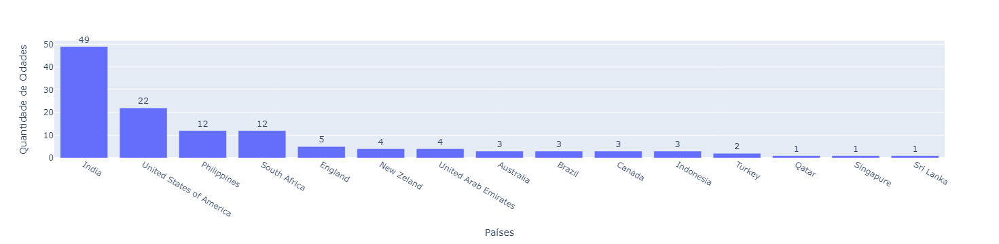

In [32]:
# Gráfico de barras com quantidade de cidades registrados por país
df_aux = df1.loc[:, ['country_name', 'city']].groupby('country_name').nunique().sort_values('city', ascending=False).reset_index()
fig = px.bar(df_aux, x='country_name', y='city', text_auto=True, labels={"country_name": "Países", "city": "Quantidade de Cidades"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 2. Qual o nome do país que possui mais restaurantes registrados?

In [33]:
filtro = df1.loc[:, ['restaurant_id', 'country_name']].groupby('country_name').count().sort_values('restaurant_id', ascending=False).reset_index()
country_name = filtro.iloc[0,0]
restaurant_count = filtro.iloc[0,1]
print(f"O país com mais restaurantes é {country_name} com {restaurant_count} registros.")

O país com mais restaurantes é India com 3111 registros.


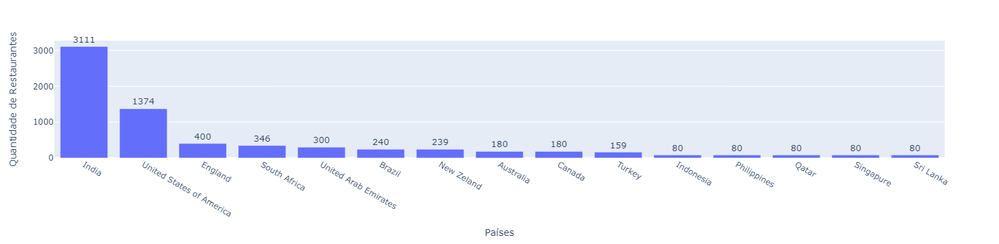

In [34]:
# Gráfico de barras com quantidade de restaurantes registrados por país
df_aux = df1.loc[:, ['country_name', 'restaurant_id']].groupby('country_name').nunique().sort_values('restaurant_id', ascending=False).reset_index()
fig = px.bar(df_aux, x='country_name', y='restaurant_id', text_auto=True, labels={"country_name": "Países", "restaurant_id": "Quantidade de Restaurantes"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 3. Qual o nome do país que possui mais restaurantes com o nível de preço igual a 4 registrados?

In [36]:
filtro = df1.loc[(df1['price_range'] == 4), ['price_range', 'country_name']].groupby('country_name').count().sort_values('price_range', ascending=False).reset_index()
country_name = filtro.iloc[0,0]
price_range_4_count = filtro.iloc[0,1]
print(f"O país que possui mais restaurantes com nível de preço igual a 4 é {country_name} com um total de {price_range_4_count} registros.")

O país que possui mais restaurantes com nível de preço igual a 4 é United States of America com um total de 415 registros.


## 4. Qual o nome do país que possui a maior quantidade de tipos de culinária distintos?

In [37]:
filtro = df1.loc[:, ['cuisines', 'country_name']].groupby('country_name').nunique().sort_values('cuisines', ascending=False).reset_index()
country_name = filtro.iloc[0,0]
number_of_distinct_cuisines = filtro.iloc[0,1]
print(f"O país que possui a maior quantidade de tipos de culinária distintos é {country_name} com um total de {number_of_distinct_cuisines} registros.")

O país que possui a maior quantidade de tipos de culinária distintos é India com um total de 77 registros.


## 5. Qual o nome do país que possui a maior quantidade de avaliações feitas?

In [38]:
filtro = df1.loc[:, ['votes', 'country_name']].groupby('country_name').sum().sort_values('votes', ascending=False).reset_index()
country_name = filtro.iloc[0,0]
number_of_votes = filtro.iloc[0,1]
print(f"O país com mais avaliações feitas é {country_name} com um total de {number_of_votes} votos.")

O país com mais avaliações feitas é India com um total de 2800164 votos.


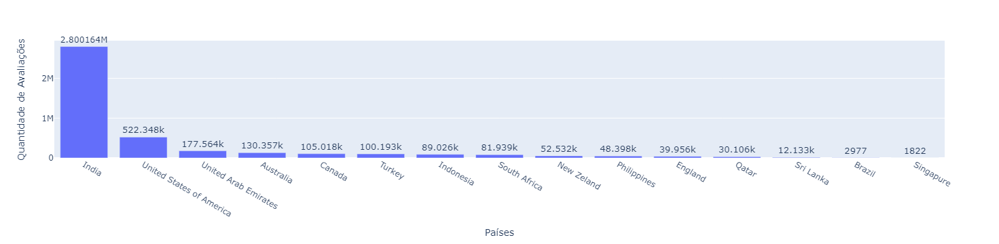

In [39]:
# Gráfico dos países com maior quantidade de avaliações
df_aux = df1.loc[:, ['votes', 'country_name']].groupby('country_name').sum().sort_values('votes', ascending=False).reset_index()
fig = px.bar(df_aux, x='country_name', y='votes', text_auto=True, labels={"country_name": "Países", "votes": "Quantidade de Avaliações"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 6. Qual o nome do país que possui a maior quantidade de restaurantes que fazem entrega?

In [40]:
filtro = df1.loc[(df1['has_online_delivery'] == 1), ['has_online_delivery', 'country_name']].groupby('country_name').count().sort_values('has_online_delivery', ascending=False).reset_index()
country_name = filtro.iloc[0,0]
has_online_delivery_count = filtro.iloc[0,1]
print(f"O país que possui mais restaurantes que fazem entrega é {country_name} com um total de {has_online_delivery_count} registros.")

O país que possui mais restaurantes que fazem entrega é India com um total de 2177 registros.


## 7. Qual o nome do país que possui a maior quantidade de restaurantes que aceitam reservas?

In [41]:
filtro = df1.loc[(df1['has_table_booking'] == 1), ['has_table_booking', 'country_name']].groupby('country_name').count().sort_values('has_table_booking', ascending=False).reset_index()
country_name = filtro.iloc[0,0]
has_table_booking = filtro.iloc[0,1]
print(f"O país que possui mais restaurantes que aceitam reservas é {country_name} com um total de {has_table_booking} registros.")

O país que possui mais restaurantes que aceitam reservas é India com um total de 256 registros.


## 8. Qual o nome do país que possui, na média, a maior quantidade de avaliações registrada?

In [42]:
filtro = round(df1.loc[:, ['votes', 'country_name']].groupby('country_name').mean().sort_values('votes', ascending=False).reset_index(), 0)
country_name = filtro.iloc[0,0]
avg_of_votes = filtro.iloc[0,1]
print(f"O país com a maior média de avaliações feitas é {country_name} com um total de {avg_of_votes} votos.")

O país com a maior média de avaliações feitas é Indonesia com um total de 1113.0 votos.


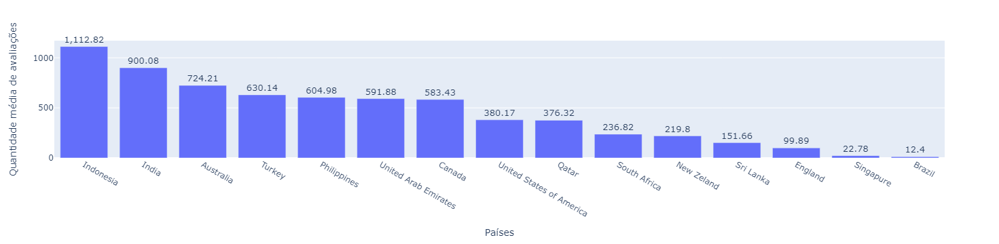

In [43]:
# Gráfico de barras com média da quantidade de avaliações feitas por país
df_aux = round(df1.loc[:, ['votes', 'country_name']].groupby('country_name').mean().sort_values('votes', ascending=False).reset_index(), 2)
fig = px.bar(df_aux, x='country_name', y='votes', text_auto=True, labels={"country_name": "Países", "votes": "Quantidade média de avaliações"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 9. Qual o nome do país que possui, na média, a maior nota média registrada?

In [44]:
filtro = round(df1.loc[:, ['aggregate_rating', 'country_name']].groupby('country_name').mean().sort_values('aggregate_rating', ascending=False).reset_index(), 4)
country_name = filtro.iloc[0,0]
country_best_avg_rating = filtro.iloc[0,1]
print(f"O país com a maior nota média registrada é {country_name} com uma nota de {country_best_avg_rating}.")

O país com a maior nota média registrada é Indonesia com uma nota de 4.6012.


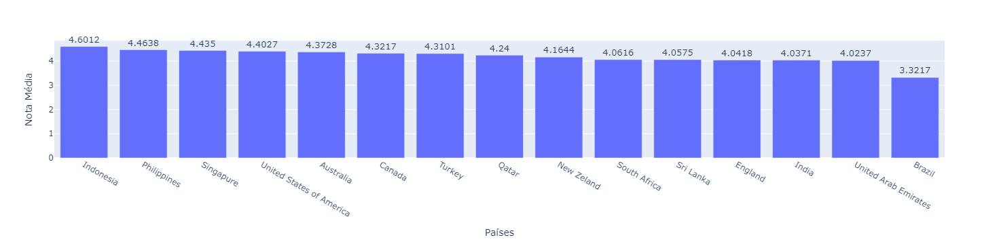

In [45]:
# Gráfico de barras com nota média por país
df_aux = round(df1.loc[:, ['aggregate_rating', 'country_name']].groupby('country_name').mean().sort_values('aggregate_rating', ascending=False).reset_index(), 4)
fig = px.bar(df_aux, x='country_name', y='aggregate_rating', text_auto=True, labels={"country_name": "Países", "aggregate_rating": "Nota Média"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 10. Qual o nome do país que possui, na média, a menor nota média registrada?

In [46]:
filtro = round(df1.loc[:, ['aggregate_rating', 'country_name']].groupby('country_name').mean().sort_values('aggregate_rating', ascending=False).reset_index(), 4)
country_name = filtro.iloc[-1,0]
country_worst_avg_rating = filtro.iloc[-1,1]
print(f"O país com a menor nota média registrada é {country_name} com uma nota de {country_worst_avg_rating}.")

O país com a menor nota média registrada é Brazil com uma nota de 3.3217.


## 11. Qual a média de preço de um prato para dois por país?

In [47]:
avg_cost_for_two = round(df1.loc[:, ['average_cost_in_usd', 'country_name']].groupby('country_name').mean().reset_index(), 2)
avg_cost_for_two

,country_name,average_cost_in_usd
0,Australia,72.19
1,Brazil,25.40
2,Canada,41.86
3,England,57.47
4,India,8.38
5,Indonesia,19.70
6,New Zeland,38.73
7,Philippines,91.84
8,Qatar,47.71
9,Singapure,141.44


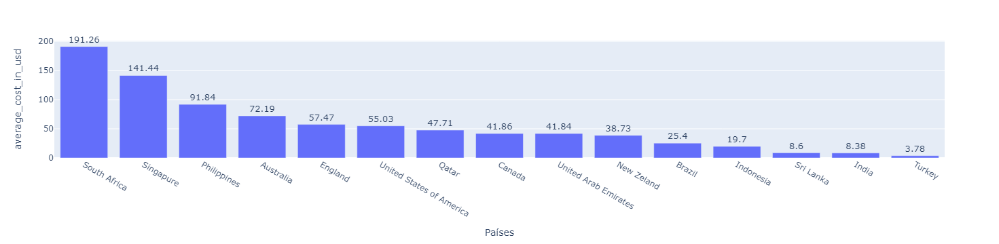

In [48]:
# Gráfico de barras com média de preço de um prato para duas pessoas por país
df_aux = round(df1.loc[:, ['average_cost_in_usd', 'country_name']].groupby('country_name').mean().sort_values('average_cost_in_usd', ascending=False).reset_index(), 2)
fig = px.bar(df_aux, x='country_name', y='average_cost_in_usd', text_auto=True, labels={"country_name": "Países", "average_cost_for_two": "Preço médio do prato para dois"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

# Perguntas sobre cidades

## 1. Qual o nome da cidade que possui mais restaurantes registrados?

In [49]:
filtro = df1.loc[:, ['restaurant_id', 'city']].groupby('city').count().sort_values('restaurant_id', ascending=False).reset_index()
city_name = filtro.iloc[0,0]
number_of_restaurants = filtro.iloc[0,1]
print(f"Segundo o critério de 'desempate' que foi passado, a cidade que possui mais registro é {city_name} com {number_of_restaurants} restaurantes.")

Segundo o critério de 'desempate' que foi passado, a cidade que possui mais registro é Abu Dhabi com 80 restaurantes.


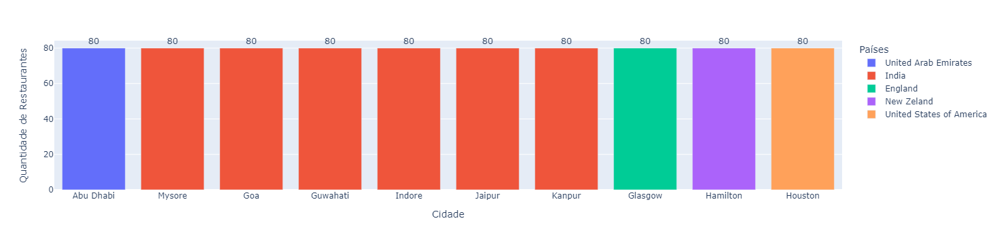

In [50]:
# Gráfico de barras com top 10 cidades com mais restaurantes colocando cores diferentes para países diferentes
df_aux = df1.loc[:, ['restaurant_id', 'city', 'country_name']].groupby(['city', 'country_name']).count().sort_values('restaurant_id', ascending=False).reset_index().head(10)
fig = px.bar(df_aux, x='city', y='restaurant_id', color='country_name', text_auto=True, labels={"city": "Cidade", "restaurant_id": "Quantidade de Restaurantes", "country_name": "Países"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 2. Qual o nome da cidade que possui mais restaurantes com nota média acima de 4?

In [51]:
filtro = df1.loc[(df1['aggregate_rating'] >= 4), ['aggregate_rating', 'city']].groupby('city').count().sort_values('aggregate_rating', ascending=False).reset_index()
city_name = filtro.iloc[0,0]
restaurants_with_rating_over_4 = filtro.iloc[0,1]
print(f"A cidade que possui mais restaurantes com nota média acima de 4 é {city_name} com {restaurants_with_rating_over_4} restaurantes.")

A cidade que possui mais restaurantes com nota média acima de 4 é London com 80 restaurantes.


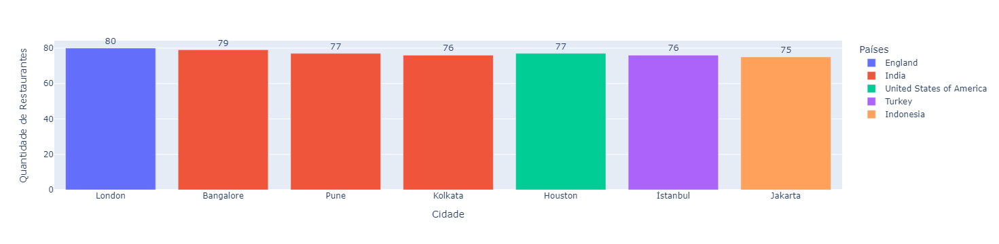

In [52]:
# Gráfico de barras com top 7 cidades com restaurantes com média de avaliação acima de 4 colocando cores diferentes para países diferentes
df_aux = df1.loc[(df1['aggregate_rating'] >= 4), ['restaurant_id', 'aggregate_rating', 'city', 'country_name']].groupby(['city', 'country_name']).count().sort_values('aggregate_rating', ascending=False).reset_index().head(7)
fig = px.bar(df_aux, x='city', y='restaurant_id', color='country_name', text_auto=True, labels={"city": "Cidade", "restaurant_id": "Quantidade de Restaurantes", "country_name": "Países"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 3. Qual o nome da cidade que possui mais restaurantes com nota média abaixo de 2.5?

In [53]:
filtro = df1.loc[(df1['aggregate_rating'] <= 2.5), ['aggregate_rating', 'city']].groupby('city').count().sort_values('aggregate_rating', ascending=False).reset_index()
city_name = filtro.iloc[0,0]
restaurants_with_rating_under_25 = filtro.iloc[0,1]
print(f"A cidade que possui mais restaurantes com nota média abaixo de 2,5 é {city_name} com {restaurants_with_rating_under_25} restaurantes.")

A cidade que possui mais restaurantes com nota média abaixo de 2,5 é Gangtok com 33 restaurantes.


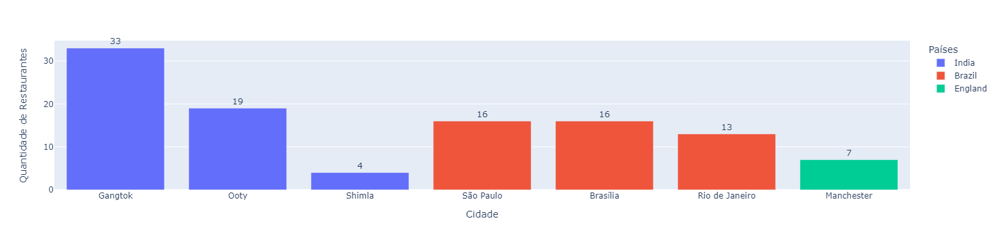

In [54]:
# Gráfico de barras com top 7 cidades com restaurantes com média de avaliação abaixo de 2.5 colocando cores diferentes para países diferentes
df_aux = df1.loc[(df1['aggregate_rating'] <= 2.5), ['restaurant_id', 'aggregate_rating', 'city', 'country_name']].groupby(['city', 'country_name']).count().sort_values('aggregate_rating', ascending=False).reset_index().head(7)
fig = px.bar(df_aux, x='city', y='restaurant_id', color='country_name', text_auto=True, labels={"city": "Cidade", "restaurant_id": "Quantidade de Restaurantes", "country_name": "Países"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 4. Qual o nome da cidade que possui o maior valor médio de um prato para dois?

In [55]:
filtro = round(df1.loc[:, ['average_cost_in_usd', 'city']].groupby('city').mean().sort_values('average_cost_in_usd', ascending=False).reset_index(), 2)
city_name = filtro.iloc[0,0]
top_avg_for_two = filtro.iloc[0,1]
print(f"A cidade que possui o maior valor médio de um prato para duas pessoas é {city_name} com um total de USD {top_avg_for_two}.")

A cidade que possui o maior valor médio de um prato para duas pessoas é Pasay City com um total de USD 299.2.


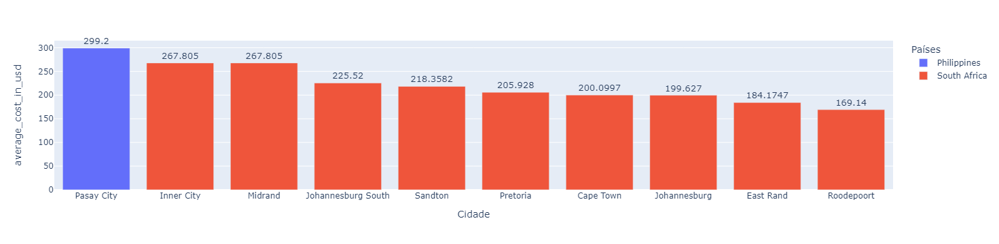

In [56]:
# Gráfico de barras com top 10 cidades com maior valor médio de um prato para dois colocando cores diferentes para países diferentes
df_aux = df1.loc[:, ['average_cost_in_usd', 'city', 'country_name']].groupby(['city', 'country_name']).mean().sort_values('average_cost_in_usd', ascending=False).reset_index().head(10)
fig = px.bar(df_aux, x='city', y='average_cost_in_usd', color='country_name', text_auto=True, labels={"city": "Cidade", "restaurant_id": "Quantidade de Restaurantes", "country_name": "Países"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 5. Qual o nome da cidade que possui a maior quantidade de tipos de culinária distintas?

In [57]:
filtro = df1.loc[:, ['cuisines', 'city']].groupby('city').nunique().sort_values('cuisines', ascending=False).reset_index()
city_name = filtro.iloc[0,0]
number_of_distinct_cuisines = filtro.iloc[0,1]
print(f"A cidade que possui a maior quantidade de tipos de culinária distintos é {city_name} com um total de {number_of_distinct_cuisines} registros.")

A cidade que possui a maior quantidade de tipos de culinária distintos é Birmingham com um total de 32 registros.


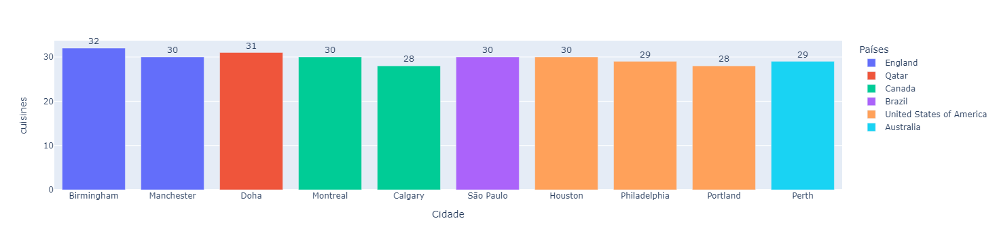

In [58]:
# Gráfico de barras com top 10 cidades com mais restaurantes de tipos de culinária distintos colocando cores diferentes para países diferentes
df_aux = df1.loc[:, ['cuisines', 'city', 'country_name']].groupby(['city', 'country_name']).nunique().sort_values('cuisines', ascending=False).reset_index().head(10)
fig = px.bar(df_aux, x='city', y='cuisines', color='country_name', text_auto=True, labels={"city": "Cidade", "restaurant_id": "Quantidade de Restaurantes", "country_name": "Países"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 6. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem reservas?

In [59]:
filtro = df1.loc[(df1['has_table_booking'] == 1), ['has_table_booking', 'city']].groupby('city').count().sort_values('has_table_booking', ascending=False).reset_index()
city_name = filtro.iloc[0,0]
table_booking_count = filtro.iloc[0,1]
print(f"A cidade com maior quantidade de restaurantes que fazem reservas é {city_name} com um total de {table_booking_count} registros.")

A cidade com maior quantidade de restaurantes que fazem reservas é Bangalore com um total de 42 registros.


## 7. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem entregas?

In [60]:
filtro = df1.loc[(df1['has_online_delivery'] == 1), ['has_online_delivery', 'city']].groupby('city').count().sort_values('has_online_delivery', ascending=False).reset_index()
city_name = filtro.iloc[0,0]
online_delivery_count = filtro.iloc[0,1]
print(f"A cidade com maior quantidade de restaurantes que fazem entregas é {city_name} com um total de {online_delivery_count} registros.")

A cidade com maior quantidade de restaurantes que fazem entregas é Bhopal com um total de 75 registros.


## 8. Qual o nome da cidade que possui a maior quantidade de restaurantes que aceitam pedidos online?

In [61]:
filtro = df1.loc[(df1['is_delivering_now'] == 1), ['is_delivering_now', 'city']].groupby('city').count().sort_values('is_delivering_now', ascending=False).reset_index()
city_name = filtro.iloc[0,0]
delivering_now_count = filtro.iloc[0,1]
print(f"A cidade com maior quantidade de restaurantes que estão entregando agora é {city_name} com um total de {delivering_now_count} registros.")

A cidade com maior quantidade de restaurantes que estão entregando agora é Vadodara com um total de 48 registros.


# Perguntas sobre restaurantes

## 1. Qual o nome do restaurante que possui a maior quantidade de avaliações?

In [62]:
filtro = df1.loc[:, ['votes', 'restaurant_name']].groupby('restaurant_name').sum().sort_values('votes', ascending=False).reset_index()
restaurant_name = filtro.iloc[0,0]
number_of_votes = filtro.iloc[0,1]
print(f"O restaurante com a maior quantidade de avaliações é {restaurant_name} com um total de {number_of_votes} votos.")

O restaurante com a maior quantidade de avaliações é Domino's Pizza com um total de 59749 votos.


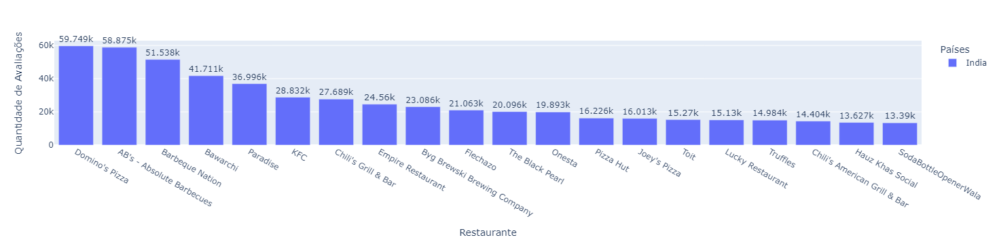

In [63]:
# Gráfico dos 20 restaurantes com mais avaliações
df_aux = df1.loc[:, ['votes', 'restaurant_name', 'country_name']].groupby(['restaurant_name', 'country_name']).sum().sort_values('votes', ascending=False).reset_index().head(20)
fig = px.bar(df_aux, x='restaurant_name', y='votes', color='country_name', text_auto=True, labels={"restaurant_name": "Restaurante", "votes": "Quantidade de Avaliações", "country_name": "Países"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 2. Qual o nome do restaurante com a maior nota média?

In [64]:
filtro = df1.loc[:, ['aggregate_rating', 'restaurant_name']].groupby('restaurant_name').max().sort_values('aggregate_rating', ascending=False).reset_index()
restaurant_name = filtro.iloc[0,0]
aggregate_rating = filtro.iloc[0,1]
print(f"O restaurante com a maior nota média é {restaurant_name} com uma nota de {aggregate_rating}.")

O restaurante com a maior nota média é The Himalayan com uma nota de 4.9.


## 3. Qual o nome do restaurante que possui o maior valor de uma prato para duas pessoas?

In [65]:
filtro = df1.loc[:, ['average_cost_in_usd', 'restaurant_name']].groupby('restaurant_name').max().sort_values('average_cost_in_usd', ascending=False).reset_index()
restaurant_name = filtro.iloc[0,0]
avg_cost_for_two = filtro.iloc[0,1]
print(f"O restaurante com o maior valor de um prato para dois é {restaurant_name}, custando {avg_cost_for_two}.")

O restaurante com o maior valor de um prato para dois é Restaurant Mosaic @ The Orient, custando 1809.798.


## 4. Qual o nome do restaurante de tipo de culinária brasileira que possui a menor média de avaliação?

In [66]:
filtro = df1.loc[(df1['cuisines'] == 'Brazilian'), ['aggregate_rating', 'restaurant_name']].groupby('restaurant_name').min().sort_values('aggregate_rating', ascending=True).reset_index()
restaurant_name = filtro.iloc[0,0]
lowest_agg_ranking = filtro.iloc[0,1]
print(f"O restaurante de culinária brasileira com a menor média de avaliação é {restaurant_name}. Sua média é de {lowest_agg_ranking}.")

O restaurante de culinária brasileira com a menor média de avaliação é Restaurante dos Amigos. Sua média é de 0.0.


## 5. Qual o nome do restaurante de tipo de culinária brasileira, e que é do Brasil, que possui a maior média de avaliação?

In [67]:
filtro = df1.loc[(df1['cuisines'] == 'Brazilian') & (df1['country_name'] == 'Brazil'), ['aggregate_rating', 'restaurant_name']].groupby('restaurant_name').max().sort_values('aggregate_rating', ascending=False).reset_index()
restaurant_name = filtro.iloc[0,0]
max_agg_ranking_br = filtro.iloc[0,1]
print(f"O restaurante do Brasil com culinária brasileira que possui a maior média de avaliação é {restaurant_name}. Sua avaliação média é de {max_agg_ranking_br}.")

O restaurante do Brasil com culinária brasileira que possui a maior média de avaliação é Braseiro da Gávea. Sua avaliação média é de 4.9.


## 6. Os restaurantes que aceitam pedido online são também, na média, os restaurantes que mais possuem avaliações registradas?

In [68]:
total_pedito_online_true = df1.loc[(df1['has_online_delivery'] == 1), 'votes'].count()
total_pedito_online_false = df1.loc[(df1['has_online_delivery'] == 0), 'votes'].count()

votes_pedito_online_true = df1.loc[(df1['has_online_delivery'] == 1), 'votes'].sum()
votes_pedito_online_false = df1.loc[(df1['has_online_delivery'] == 0), 'votes'].sum()

calc_true = round((votes_pedito_online_true / total_pedito_online_true), 2)
calc_false = round((votes_pedito_online_false / total_pedito_online_false), 2)

if calc_true > calc_false:
    print(f"Sim. Os restaurantes que aceitam pedidos online tem uma média de {calc_true} avaliações registradas vs {calc_false} de restaurantes que não aceitam.")
else:
    print(f"Não. Os restaurantes que aceitam pedidos online tem uma média de {calc_true} avaliações registradas vs {calc_false} de restaurantes que não aceitam.")

Sim. Os restaurantes que aceitam pedidos online tem uma média de 838.82 avaliações registradas vs 479.42 de restaurantes que não aceitam.


In [93]:
total_pedito_online_true = df1.loc[(df1['has_online_delivery'] == 1), 'aggregate_rating'].count()
total_pedito_online_false = df1.loc[(df1['has_online_delivery'] == 0), 'aggregate_rating'].count()

avg_nota_pedito_online_true = df1.loc[(df1['has_online_delivery'] == 1), 'aggregate_rating'].mean()
avg_nota_pedito_online_false = df1.loc[(df1['has_online_delivery'] == 0), 'aggregate_rating'].mean()

print(avg_nota_pedito_online_true)
print(avg_nota_pedito_online_false)

4.100411861614497
4.147678293712508


## 7. Os restaurantes que fazem reservas são também, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas?

In [69]:
avg_reservas_true = round(df1.loc[(df1['has_table_booking'] == 1), 'average_cost_in_usd'].mean(), 4)
avg_reservas_false = round(df1.loc[(df1['has_table_booking'] == 0), 'average_cost_in_usd'].mean(), 4)

if avg_reservas_true > avg_reservas_false:
    print(f"Sim. Os restaurantes que fazem reservas tem um valor médio para duas pessoas de USD {avg_reservas_true} enquanto os que não aceitam reservas tem um valor de USD {avg_reservas_false}.")
else:
    print(f"Não. Os restaurantes que fazem reservas tem um valor médio para duas pessoas de USD {avg_reservas_true} enquanto os que não aceitam reservas tem um valor de USD {avg_reservas_false}.")

Não. Os restaurantes que fazem reservas tem um valor médio para duas pessoas de USD 38.1322 enquanto os que não aceitam reservas tem um valor de USD 38.1958.


## 8. Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América possuem um valor médio de prato para duas pessoas maior que as churrascarias americanas (BBQ)?

In [70]:
avg_for_two_usa_japanese = round(df1.loc[(df1['country_name'] == 'United States of America') & (df1['cuisines'] == 'Japanese'), 'average_cost_in_usd'].mean(), 2)
avg_for_two_usa_bbq = round(df1.loc[(df1['country_name'] == 'United States of America') & (df1['cuisines'] == 'BBQ'), 'average_cost_in_usd'].mean(), 2)
if avg_for_two_usa_japanese > avg_for_two_usa_bbq:
    print(f"O valor médio de um prato de comida japonesa para 2 nos EUA é de USD {avg_for_two_usa_japanese}, portanto, é MAIOR do que o valor médio do BBQ que é de USD {avg_for_two_usa_bbq}")
else:
    print(f"O valor médio de um prato de comida japonesa para 2 nos EUA é de USD {avg_for_two_usa_japanese}, portanto, é MENOR do que o valor médio do BBQ que é de USD {avg_for_two_usa_bbq}")

O valor médio de um prato de comida japonesa para 2 nos EUA é de USD 56.41, portanto, é MAIOR do que o valor médio do BBQ que é de USD 39.64


# Perguntas sobre tipos de culinária

## 1. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a maior média de avaliação?

In [71]:
filtro = df1.loc[(df1['cuisines'] == 'Italian'), ['restaurant_name', 'aggregate_rating']].sort_values('aggregate_rating', ascending=False).reset_index(drop=True)
restaurant_name = filtro.iloc[0,0]
restaurant_agg_rating = filtro.iloc[0,1]
print(f"O restaurante de culinária italiana com a maior média de avaliação é {restaurant_name} com uma nota de {restaurant_agg_rating}.")

O restaurante de culinária italiana com a maior média de avaliação é Andre's Cucina & Polenta Bar com uma nota de 4.9.


## 2. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a menor média de avaliação?

In [72]:
filtro = df1.loc[(df1['cuisines'] == 'Italian'), ['restaurant_name', 'aggregate_rating']].sort_values('aggregate_rating', ascending=True).reset_index(drop=True)
restaurant_name = filtro.iloc[0,0]
restaurant_agg_rating = filtro.iloc[0,1]
print(f"O restaurante de culinária italiana com a menor média de avaliação é {restaurant_name} com uma nota de {restaurant_agg_rating}.")

O restaurante de culinária italiana com a menor média de avaliação é Le Delicatezze Di Bruno com uma nota de 0.0.


## 3. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a maior média de avaliação?

In [73]:
filtro = df1.loc[(df1['cuisines'] == 'American'), ['restaurant_name', 'aggregate_rating']].sort_values('aggregate_rating', ascending=False).reset_index(drop=True)
restaurant_name = filtro.iloc[0,0]
restaurant_agg_rating = filtro.iloc[0,1]
print(f"O restaurante de culinária americana com a maior média de avaliação é {restaurant_name} com uma nota de {restaurant_agg_rating}.")

O restaurante de culinária americana com a maior média de avaliação é OEB Breakfast Co. com uma nota de 4.9.


## 4. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a menor média de avaliação?

In [74]:
filtro = df1.loc[(df1['cuisines'] == 'American'), ['restaurant_name', 'aggregate_rating']].sort_values('aggregate_rating', ascending=True).reset_index(drop=True)
restaurant_name = filtro.iloc[0,0]
restaurant_agg_rating = filtro.iloc[0,1]
print(f"O restaurante de culinária americana com a menor média de avaliação é {restaurant_name} com uma nota de {restaurant_agg_rating}.")

O restaurante de culinária americana com a menor média de avaliação é Alston Bar & Beef com uma nota de 0.0.


## 5. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do estaurante com a maior média de avaliação?

In [75]:
filtro = df1.loc[(df1['cuisines'] == 'Arabian'), ['restaurant_name', 'aggregate_rating']].sort_values('aggregate_rating', ascending=False).reset_index(drop=True)
restaurant_name = filtro.iloc[0,0]
restaurant_agg_rating = filtro.iloc[0,1]
print(f"O restaurante de culinária árabe com a maior média de avaliação é {restaurant_name} com uma nota de {restaurant_agg_rating}.")

O restaurante de culinária árabe com a maior média de avaliação é Mandi@36 com uma nota de 4.7.


## 6. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a menor média de avaliação?

In [76]:
filtro = df1.loc[(df1['cuisines'] == 'Arabian'), ['restaurant_name', 'aggregate_rating']].sort_values('aggregate_rating', ascending=True).reset_index(drop=True)
restaurant_name = filtro.iloc[0,0]
restaurant_agg_rating = filtro.iloc[0,1]
print(f"O restaurante de culinária árabe com a menor média de avaliação é {restaurant_name} com uma nota de {restaurant_agg_rating}.")

O restaurante de culinária árabe com a menor média de avaliação é Raful com uma nota de 0.0.


## 7. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a maior média de avaliação?

In [77]:
filtro = df1.loc[(df1['cuisines'] == 'Japanese'), ['restaurant_name', 'aggregate_rating']].sort_values('aggregate_rating', ascending=False).reset_index(drop=True)
restaurant_name = filtro.iloc[0,0]
restaurant_agg_rating = filtro.iloc[0,1]
print(f"O restaurante de culinária japonesa com a maior média de avaliação é {restaurant_name} com uma nota de {restaurant_agg_rating}.")

O restaurante de culinária japonesa com a maior média de avaliação é Sushi Leblon com uma nota de 4.9.


## 8. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a menor média de avaliação?

In [78]:
filtro = df1.loc[(df1['cuisines'] == 'Japanese'), ['restaurant_name', 'aggregate_rating']].sort_values('aggregate_rating', ascending=True).reset_index(drop=True)
restaurant_name = filtro.iloc[0,0]
restaurant_agg_rating = filtro.iloc[0,1]
print(f"O restaurante de culinária japonesa com a menor média de avaliação é {restaurant_name} com uma nota de {restaurant_agg_rating}.")

O restaurante de culinária japonesa com a menor média de avaliação é Banzai Sushi com uma nota de 0.0.


## 9. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a maior média de avaliação?

In [79]:
filtro = df1.loc[(df1['cuisines'] == 'Home-made'), ['restaurant_name', 'aggregate_rating']].sort_values('aggregate_rating', ascending=False).reset_index(drop=True)
restaurant_name = filtro.iloc[0,0]
restaurant_agg_rating = filtro.iloc[0,1]
print(f"O restaurante de culinária caseira com a maior média de avaliação é {restaurant_name} com uma nota de {restaurant_agg_rating}.")

O restaurante de culinária caseira com a maior média de avaliação é Kanaat Lokantası com uma nota de 4.0.


## 10. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a menor média de avaliação?

In [80]:
filtro = df1.loc[(df1['cuisines'] == 'Home-made'), ['restaurant_name', 'aggregate_rating']].sort_values('aggregate_rating', ascending=True).reset_index(drop=True)
restaurant_name = filtro.iloc[0,0]
restaurant_agg_rating = filtro.iloc[0,1]
print(f"O restaurante de culinária caseira com a menor média de avaliação é {restaurant_name} com uma nota de {restaurant_agg_rating}.")

O restaurante de culinária caseira com a menor média de avaliação é GurMekan Restaurant com uma nota de 3.7.


## 11. Qual o tipo de culinária que possui o maior valor médio de um prato para duas pessoas?

In [81]:
filtro = round(df1.loc[:, ['average_cost_in_usd', 'cuisines']].groupby('cuisines').mean().sort_values('average_cost_in_usd', ascending=False).reset_index(), 2)
cuisine_name = filtro.iloc[0,0]
avg_for_two = filtro.iloc[0,1]
print(f"O tipo de culinária com o maior valor médio para dois é {cuisine_name}. O preço médio é de {avg_for_two}.")

O tipo de culinária com o maior valor médio para dois é New Mexican. O preço médio é de 180.0.


## 12. Qual o tipo de culinária que possui a maior nota média?

In [82]:
filtro = round(df1.loc[:, ['aggregate_rating', 'cuisines']].groupby('cuisines').mean().sort_values('aggregate_rating', ascending=False).reset_index(), 1)
cuisine_name = filtro.iloc[0,0]
avg_rating = filtro.iloc[0,1]
print(f"O tipo de culinária com a maior nota média é {cuisine_name}. A nota é de {avg_rating}.")

O tipo de culinária com a maior nota média é Others. A nota é de 4.9.


In [83]:
# Tabela com top 10 restaurantes
cols = ['restaurant_name', 'country_name', 'city', 'cuisines', 'aggregate_rating', 'votes', 'average_cost_in_usd']
top_10 = df1.loc[:, cols].sort_values('aggregate_rating', ascending=False).head(10)
top_10

,restaurant_name,country_name,city,cuisines,aggregate_rating,votes,average_cost_in_usd
779,The Purple Pig,United States of America,Chicago,Mediterranean,4.9,998,110.0000
177,Churrascaria Palace,Brazil,Rio de Janeiro,Steak,4.9,20,40.2600
4321,Pabbas,India,Mangalore,Ice Cream,4.9,1819,2.9750
3533,Indian Grill Room,India,Gurgaon,North Indian,4.9,3062,21.4200
6114,Chin Chin Labs,England,London,Ice Cream,4.9,216,19.8135
756,The Cowfish Sushi Burger Bar,United States of America,Charlotte,Burger,4.9,731,40.0000
782,Smoque BBQ,United States of America,Chicago,BBQ,4.9,594,35.0000
3309,Kalsang AMA Cafe,India,Dehradun,Cafe,4.9,800,8.9250
907,Big Bill's,United States of America,Denver,Italian,4.9,186,10.0000
5591,Sushi Masa,Indonesia,Jakarta,Sushi,4.9,1334,32.5000


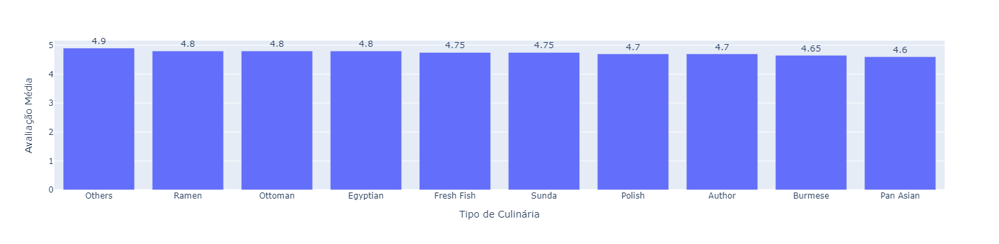

In [84]:
# Gráfico de barras com top 10 melhores tipos culinários
df_aux = round(df1.loc[:, ['aggregate_rating', 'cuisines']].groupby('cuisines').mean().sort_values('aggregate_rating', ascending=False).reset_index().head(10), 2)
fig = px.bar(df_aux, x='cuisines', y='aggregate_rating', text_auto=True, labels={"cuisines": "Tipo de Culinária", "aggregate_rating": "Avaliação Média"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

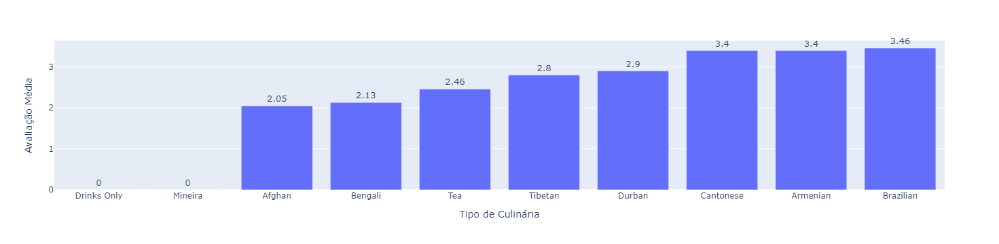

In [85]:
# Gráfico de barras com top 10 piores tipos culinários
df_aux = round(df1.loc[:, ['aggregate_rating', 'cuisines']].groupby('cuisines').mean().sort_values('aggregate_rating', ascending=True).reset_index().head(10), 2)
fig = px.bar(df_aux, x='cuisines', y='aggregate_rating', text_auto=True, labels={"cuisines": "Tipo de Culinária", "aggregate_rating": "Avaliação Média"})
fig.update_traces(textfont_size=13, textangle=0, textposition='outside', cliponaxis=False)
fig.show()

## 13. Qual o tipo de culinária que possui mais restaurantes que aceitam pedidos online e fazem entregas?

In [86]:
filtro = df1.loc[(df1['has_online_delivery'] == 1) & (df1['is_delivering_now'] == 1), ['restaurant_id', 'cuisines']].groupby('cuisines').count().sort_values('restaurant_id', ascending=False).reset_index()
cuisine_name = filtro.iloc[0,0]
restaurant_count = filtro.iloc[0,1]
print(f"O tipo de culinária que mais aceita pedidos online e faz entregas é {cuisine_name} com um total de {restaurant_count} restaurantes.")

O tipo de culinária que mais aceita pedidos online e faz entregas é North Indian com um total de 317 restaurantes.
